In [1]:
#Resnet train and validation
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset, Subset
from torchvision.datasets import ImageFolder
from torchvision import transforms

from transformers import AutoModelForImageClassification, AutoImageProcessor

import os
from tqdm import tqdm
import numpy as np

# Config parameters

MODEL_CHOICE = 'resnet50' 

MODEL_CHECKPOINTS = {
    'resnet50': 'microsoft/resnet-50'
}
MODEL_CHECKPOINT = MODEL_CHECKPOINTS[MODEL_CHOICE]

DATA_DIR = 'newarchive'

DATA_USAGE_RATIO = 1

NUM_EPOCHS = 40
BATCH_SIZE = 32 
LEARNING_RATE = 2e-5 
VAL_SPLIT = 0.2
TEST_SPLIT = 0.1  

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Device: {device}")


# Data loading and transforms

class_names = sorted([d.name for d in os.scandir(DATA_DIR) if d.is_dir()])
num_labels = len(class_names)
label2id = {name: i for i, name in enumerate(class_names)}
id2label = {i: name for i, name in enumerate(class_names)}

print(f"Found {num_labels} classes: {class_names}")

image_processor = AutoImageProcessor.from_pretrained(MODEL_CHECKPOINT)

size = image_processor.size["shortest_edge"]
mean = image_processor.image_mean
std = image_processor.image_std

# Train and validation
train_transforms = transforms.Compose([
    transforms.RandomResizedCrop(size, scale=(0.7, 1.0)), 
    transforms.RandomHorizontalFlip(),                   
    transforms.ToTensor(),                               
    transforms.Normalize(mean=mean, std=std),           
])

val_transforms = transforms.Compose([
    transforms.Resize(size),
    transforms.CenterCrop(size),
    transforms.ToTensor(),
    transforms.Normalize(mean=mean, std=std),
])


class TransformedDataset(Dataset):
    def __init__(self, subset, transform=None):
        self.subset = subset
        self.transform = transform

    def __getitem__(self, index):
        x, y = self.subset[index]
        if self.transform:
            x = self.transform(x)
        return x, y

    def __len__(self):
        return len(self.subset)
    
full_dataset = ImageFolder(root=DATA_DIR)
print(f"Full dataset size: {len(full_dataset)}")

test_size = int(len(full_dataset) * TEST_SPLIT)
train_val_size = len(full_dataset) - test_size
generator = torch.Generator().manual_seed(42)

dataset_to_split, test_subset = torch.utils.data.random_split(
    full_dataset, [train_val_size, test_size], generator=generator
)

total_size = len(dataset_to_split)
val_size = int(total_size * VAL_SPLIT)
train_size = total_size - val_size

train_subset, val_subset = torch.utils.data.random_split(dataset_to_split, [train_size, val_size], generator=torch.Generator().manual_seed(42))

train_dataset = TransformedDataset(train_subset, transform=train_transforms)
val_dataset = TransformedDataset(val_subset, transform=val_transforms)
test_dataset = TransformedDataset(test_subset, transform=val_transforms)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=4, pin_memory=True)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=4, pin_memory=True)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=4, pin_memory=True)

print(f"\nOriginal dataset has been split into:")
print(f"  - Training dataset size:   {len(train_dataset)}")
print(f"  - Validation dataset size: {len(val_dataset)}")
print(f"  - Test dataset size:       {len(test_dataset)}\n")


# Loading pre-trained model
model = AutoModelForImageClassification.from_pretrained(
    MODEL_CHECKPOINT,
    num_labels=num_labels,
    label2id=label2id,
    id2label=id2label,
    ignore_mismatched_sizes=True
)

model.to(device)

optimizer = optim.AdamW(model.parameters(), lr=LEARNING_RATE, weight_decay=1e-4) 

best_val_accuracy = 0.0
best_model_save_path = f'./{MODEL_CHOICE}_best_model'


# Training and validation epoches
for epoch in range(NUM_EPOCHS):
    print(f"\n--- Epoch {epoch + 1}/{NUM_EPOCHS} ---")

    model.train()
    train_loss = 0.0
    train_corrects = 0
    train_total = 0

    pbar_train = tqdm(train_loader, desc="Training...")
    for inputs, labels in pbar_train:
        inputs = inputs.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()
        outputs = model(pixel_values=inputs, labels=labels)
        loss = outputs.loss
        logits = outputs.logits
        
        loss.backward()
        optimizer.step()

        train_loss += loss.item() * inputs.size(0)
        _, preds = torch.max(logits, 1)
        train_corrects += torch.sum(preds == labels.data)
        train_total += labels.size(0)
        pbar_train.set_postfix({'loss': f'{loss.item():.4f}'})

    epoch_train_loss = train_loss / train_total
    epoch_train_acc = train_corrects.double() / train_total

    #Validation
    model.eval()
    val_loss = 0.0
    val_corrects = 0
    val_total = 0

    with torch.no_grad():
        pbar_val = tqdm(val_loader, desc="Validation:")
        for inputs, labels in pbar_val:
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(pixel_values=inputs, labels=labels)
            loss = outputs.loss
            logits = outputs.logits

            val_loss += loss.item() * inputs.size(0)
            _, preds = torch.max(logits, 1)
            val_corrects += torch.sum(preds == labels.data)
            val_total += labels.size(0)
            pbar_val.set_postfix({'loss': f'{loss.item():.4f}'})

    epoch_val_loss = val_loss / val_total
    epoch_val_acc = val_corrects.double() / val_total

    print(f"Epoch {epoch + 1} Result: ")
    print(f"  Train - Loss: {epoch_train_loss:.4f}, Accuracy: {epoch_train_acc:.4f}")
    print(f"  Val - Loss: {epoch_val_loss:.4f}, Accuracy: {epoch_val_acc:.4f}")

    if epoch_val_acc > best_val_accuracy:
        best_val_accuracy = epoch_val_acc
        print(f"\nFound the best model! Val Accuracy: {best_val_accuracy:.4f}")
        
        if not os.path.exists(best_model_save_path):
            os.makedirs(best_model_save_path)
            
        print(f"Saved the best model to: {best_model_save_path}")
        model.save_pretrained(best_model_save_path)
        image_processor.save_pretrained(best_model_save_path)
        print("Saved successfully!")


print("\n--- Train finished ---")
print(f"Best model saved to: {best_model_save_path}")
print(f"Best model accuracy: {best_val_accuracy:.4f}")


Device: cuda
Found 5 classes: ['Expressionism', 'Impressionism', 'Realism', 'Romanticism', 'Symbolism']


Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


Full dataset size: 22230

Original dataset has been split into:
  - Training dataset size:   16006
  - Validation dataset size: 4001
  - Test dataset size:       2223



Some weights of ResNetForImageClassification were not initialized from the model checkpoint at microsoft/resnet-50 and are newly initialized because the shapes did not match:
- classifier.1.bias: found shape torch.Size([1000]) in the checkpoint and torch.Size([5]) in the model instantiated
- classifier.1.weight: found shape torch.Size([1000, 2048]) in the checkpoint and torch.Size([5, 2048]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



--- Epoch 1/40 ---


Validation:: 100%|██████████| 126/126 [01:32<00:00,  1.37it/s, loss=1.4689]


Epoch 1 Result: 
  Train - Loss: 1.5392, Accuracy: 0.3887
  Val - Loss: 1.4412, Accuracy: 0.4844

Found the best model! Val Accuracy: 0.4844
Saved the best model to: ./resnet50_best_model
Saved successfully!

--- Epoch 2/40 ---


Validation:: 100%|██████████| 126/126 [00:48<00:00,  2.60it/s, loss=1.3603]


Epoch 2 Result: 
  Train - Loss: 1.3030, Accuracy: 0.5074
  Val - Loss: 1.1924, Accuracy: 0.5569

Found the best model! Val Accuracy: 0.5569
Saved the best model to: ./resnet50_best_model
Saved successfully!

--- Epoch 3/40 ---


Validation:: 100%|██████████| 126/126 [00:47<00:00,  2.66it/s, loss=1.3841]


Epoch 3 Result: 
  Train - Loss: 1.0936, Accuracy: 0.5885
  Val - Loss: 1.0289, Accuracy: 0.6146

Found the best model! Val Accuracy: 0.6146
Saved the best model to: ./resnet50_best_model
Saved successfully!

--- Epoch 4/40 ---


Validation:: 100%|██████████| 126/126 [00:47<00:00,  2.65it/s, loss=1.3654]


Epoch 4 Result: 
  Train - Loss: 0.9800, Accuracy: 0.6266
  Val - Loss: 0.9447, Accuracy: 0.6293

Found the best model! Val Accuracy: 0.6293
Saved the best model to: ./resnet50_best_model
Saved successfully!

--- Epoch 5/40 ---


Validation:: 100%|██████████| 126/126 [00:48<00:00,  2.60it/s, loss=1.4267]


Epoch 5 Result: 
  Train - Loss: 0.9075, Accuracy: 0.6535
  Val - Loss: 0.8815, Accuracy: 0.6628

Found the best model! Val Accuracy: 0.6628
Saved the best model to: ./resnet50_best_model
Saved successfully!

--- Epoch 6/40 ---


Validation:: 100%|██████████| 126/126 [00:48<00:00,  2.58it/s, loss=1.6910]


Epoch 6 Result: 
  Train - Loss: 0.8506, Accuracy: 0.6757
  Val - Loss: 0.8616, Accuracy: 0.6696

Found the best model! Val Accuracy: 0.6696
Saved the best model to: ./resnet50_best_model
Saved successfully!

--- Epoch 7/40 ---


Validation:: 100%|██████████| 126/126 [00:48<00:00,  2.62it/s, loss=1.5754]


Epoch 7 Result: 
  Train - Loss: 0.8155, Accuracy: 0.6922
  Val - Loss: 0.8262, Accuracy: 0.6828

Found the best model! Val Accuracy: 0.6828
Saved the best model to: ./resnet50_best_model
Saved successfully!

--- Epoch 8/40 ---


Validation:: 100%|██████████| 126/126 [00:48<00:00,  2.61it/s, loss=1.3859]


Epoch 8 Result: 
  Train - Loss: 0.7773, Accuracy: 0.7044
  Val - Loss: 0.8085, Accuracy: 0.6946

Found the best model! Val Accuracy: 0.6946
Saved the best model to: ./resnet50_best_model
Saved successfully!

--- Epoch 9/40 ---


Validation:: 100%|██████████| 126/126 [00:48<00:00,  2.61it/s, loss=1.0831]


Epoch 9 Result: 
  Train - Loss: 0.7487, Accuracy: 0.7150
  Val - Loss: 0.7968, Accuracy: 0.6901

--- Epoch 10/40 ---


Validation:: 100%|██████████| 126/126 [00:48<00:00,  2.59it/s, loss=1.2653]


Epoch 10 Result: 
  Train - Loss: 0.7258, Accuracy: 0.7215
  Val - Loss: 0.7781, Accuracy: 0.7073

Found the best model! Val Accuracy: 0.7073
Saved the best model to: ./resnet50_best_model
Saved successfully!

--- Epoch 11/40 ---


Validation:: 100%|██████████| 126/126 [00:48<00:00,  2.58it/s, loss=1.1887]


Epoch 11 Result: 
  Train - Loss: 0.6997, Accuracy: 0.7363
  Val - Loss: 0.7660, Accuracy: 0.7088

Found the best model! Val Accuracy: 0.7088
Saved the best model to: ./resnet50_best_model
Saved successfully!

--- Epoch 12/40 ---


Validation:: 100%|██████████| 126/126 [00:48<00:00,  2.62it/s, loss=1.2147]


Epoch 12 Result: 
  Train - Loss: 0.6790, Accuracy: 0.7445
  Val - Loss: 0.7589, Accuracy: 0.7088

--- Epoch 13/40 ---


Validation:: 100%|██████████| 126/126 [00:48<00:00,  2.62it/s, loss=0.9978]


Epoch 13 Result: 
  Train - Loss: 0.6611, Accuracy: 0.7507
  Val - Loss: 0.7624, Accuracy: 0.7053

--- Epoch 14/40 ---


Validation:: 100%|██████████| 126/126 [00:48<00:00,  2.61it/s, loss=1.0091]


Epoch 14 Result: 
  Train - Loss: 0.6413, Accuracy: 0.7583
  Val - Loss: 0.7560, Accuracy: 0.7116

Found the best model! Val Accuracy: 0.7116
Saved the best model to: ./resnet50_best_model
Saved successfully!

--- Epoch 15/40 ---


Validation:: 100%|██████████| 126/126 [00:48<00:00,  2.62it/s, loss=1.0142]


Epoch 15 Result: 
  Train - Loss: 0.6218, Accuracy: 0.7692
  Val - Loss: 0.7347, Accuracy: 0.7191

Found the best model! Val Accuracy: 0.7191
Saved the best model to: ./resnet50_best_model
Saved successfully!

--- Epoch 16/40 ---


Validation:: 100%|██████████| 126/126 [00:48<00:00,  2.61it/s, loss=0.8626]


Epoch 16 Result: 
  Train - Loss: 0.6091, Accuracy: 0.7761
  Val - Loss: 0.7356, Accuracy: 0.7183

--- Epoch 17/40 ---


Validation:: 100%|██████████| 126/126 [00:47<00:00,  2.64it/s, loss=0.7729]


Epoch 17 Result: 
  Train - Loss: 0.5931, Accuracy: 0.7819
  Val - Loss: 0.7416, Accuracy: 0.7223

Found the best model! Val Accuracy: 0.7223
Saved the best model to: ./resnet50_best_model
Saved successfully!

--- Epoch 18/40 ---


Validation:: 100%|██████████| 126/126 [00:46<00:00,  2.68it/s, loss=1.5386]


Epoch 18 Result: 
  Train - Loss: 0.5782, Accuracy: 0.7851
  Val - Loss: 0.7388, Accuracy: 0.7213

--- Epoch 19/40 ---


Validation:: 100%|██████████| 126/126 [00:48<00:00,  2.60it/s, loss=1.1541]


Epoch 19 Result: 
  Train - Loss: 0.5611, Accuracy: 0.7905
  Val - Loss: 0.7337, Accuracy: 0.7251

Found the best model! Val Accuracy: 0.7251
Saved the best model to: ./resnet50_best_model
Saved successfully!

--- Epoch 20/40 ---


Validation:: 100%|██████████| 126/126 [00:48<00:00,  2.61it/s, loss=0.8187]


Epoch 20 Result: 
  Train - Loss: 0.5441, Accuracy: 0.7965
  Val - Loss: 0.7144, Accuracy: 0.7341

Found the best model! Val Accuracy: 0.7341
Saved the best model to: ./resnet50_best_model
Saved successfully!

--- Epoch 21/40 ---


Validation:: 100%|██████████| 126/126 [00:49<00:00,  2.54it/s, loss=0.9231]


Epoch 21 Result: 
  Train - Loss: 0.5242, Accuracy: 0.8063
  Val - Loss: 0.7162, Accuracy: 0.7348

Found the best model! Val Accuracy: 0.7348
Saved the best model to: ./resnet50_best_model
Saved successfully!

--- Epoch 22/40 ---


Validation:: 100%|██████████| 126/126 [00:49<00:00,  2.57it/s, loss=0.9309]


Epoch 22 Result: 
  Train - Loss: 0.5178, Accuracy: 0.8101
  Val - Loss: 0.7143, Accuracy: 0.7331

--- Epoch 23/40 ---


Validation:: 100%|██████████| 126/126 [00:48<00:00,  2.61it/s, loss=0.9402]


Epoch 23 Result: 
  Train - Loss: 0.4993, Accuracy: 0.8184
  Val - Loss: 0.7166, Accuracy: 0.7341

--- Epoch 24/40 ---


Validation:: 100%|██████████| 126/126 [00:48<00:00,  2.62it/s, loss=0.8888]


Epoch 24 Result: 
  Train - Loss: 0.4888, Accuracy: 0.8191
  Val - Loss: 0.7185, Accuracy: 0.7343

--- Epoch 25/40 ---


Validation:: 100%|██████████| 126/126 [00:48<00:00,  2.59it/s, loss=1.0755]


Epoch 25 Result: 
  Train - Loss: 0.4711, Accuracy: 0.8283
  Val - Loss: 0.7132, Accuracy: 0.7388

Found the best model! Val Accuracy: 0.7388
Saved the best model to: ./resnet50_best_model
Saved successfully!

--- Epoch 26/40 ---


Validation:: 100%|██████████| 126/126 [00:47<00:00,  2.63it/s, loss=0.6338]


Epoch 26 Result: 
  Train - Loss: 0.4592, Accuracy: 0.8319
  Val - Loss: 0.7258, Accuracy: 0.7351

--- Epoch 27/40 ---


Validation:: 100%|██████████| 126/126 [00:49<00:00,  2.54it/s, loss=0.6429]


Epoch 27 Result: 
  Train - Loss: 0.4425, Accuracy: 0.8381
  Val - Loss: 0.7285, Accuracy: 0.7393

Found the best model! Val Accuracy: 0.7393
Saved the best model to: ./resnet50_best_model
Saved successfully!

--- Epoch 28/40 ---


Validation:: 100%|██████████| 126/126 [00:48<00:00,  2.62it/s, loss=0.8272]


Epoch 28 Result: 
  Train - Loss: 0.4297, Accuracy: 0.8429
  Val - Loss: 0.7257, Accuracy: 0.7406

Found the best model! Val Accuracy: 0.7406
Saved the best model to: ./resnet50_best_model
Saved successfully!

--- Epoch 29/40 ---


Validation:: 100%|██████████| 126/126 [00:49<00:00,  2.56it/s, loss=0.6262]


Epoch 29 Result: 
  Train - Loss: 0.4159, Accuracy: 0.8467
  Val - Loss: 0.7298, Accuracy: 0.7396

--- Epoch 30/40 ---


Validation:: 100%|██████████| 126/126 [00:48<00:00,  2.58it/s, loss=0.7969]


Epoch 30 Result: 
  Train - Loss: 0.4029, Accuracy: 0.8514
  Val - Loss: 0.7342, Accuracy: 0.7368

--- Epoch 31/40 ---


Validation:: 100%|██████████| 126/126 [00:49<00:00,  2.54it/s, loss=0.4369]


Epoch 31 Result: 
  Train - Loss: 0.3916, Accuracy: 0.8594
  Val - Loss: 0.7317, Accuracy: 0.7438

Found the best model! Val Accuracy: 0.7438
Saved the best model to: ./resnet50_best_model
Saved successfully!

--- Epoch 32/40 ---


Validation:: 100%|██████████| 126/126 [00:48<00:00,  2.61it/s, loss=0.3607]


Epoch 32 Result: 
  Train - Loss: 0.3829, Accuracy: 0.8640
  Val - Loss: 0.7390, Accuracy: 0.7426

--- Epoch 33/40 ---


Validation:: 100%|██████████| 126/126 [00:47<00:00,  2.63it/s, loss=0.4746]


Epoch 33 Result: 
  Train - Loss: 0.3683, Accuracy: 0.8682
  Val - Loss: 0.7363, Accuracy: 0.7371

--- Epoch 34/40 ---


Validation:: 100%|██████████| 126/126 [00:47<00:00,  2.63it/s, loss=0.5124]


Epoch 34 Result: 
  Train - Loss: 0.3569, Accuracy: 0.8723
  Val - Loss: 0.7412, Accuracy: 0.7446

Found the best model! Val Accuracy: 0.7446
Saved the best model to: ./resnet50_best_model
Saved successfully!

--- Epoch 35/40 ---


Validation:: 100%|██████████| 126/126 [00:47<00:00,  2.65it/s, loss=0.5292]


Epoch 35 Result: 
  Train - Loss: 0.3443, Accuracy: 0.8750
  Val - Loss: 0.7488, Accuracy: 0.7396

--- Epoch 36/40 ---


Validation:: 100%|██████████| 126/126 [00:47<00:00,  2.66it/s, loss=0.5592]


Epoch 36 Result: 
  Train - Loss: 0.3386, Accuracy: 0.8796
  Val - Loss: 0.7581, Accuracy: 0.7426

--- Epoch 37/40 ---


Validation:: 100%|██████████| 126/126 [00:46<00:00,  2.69it/s, loss=0.3358]


Epoch 37 Result: 
  Train - Loss: 0.3291, Accuracy: 0.8830
  Val - Loss: 0.7615, Accuracy: 0.7441

--- Epoch 38/40 ---


Validation:: 100%|██████████| 126/126 [00:47<00:00,  2.64it/s, loss=0.5413]


Epoch 38 Result: 
  Train - Loss: 0.3148, Accuracy: 0.8890
  Val - Loss: 0.7645, Accuracy: 0.7423

--- Epoch 39/40 ---


Validation:: 100%|██████████| 126/126 [00:47<00:00,  2.66it/s, loss=0.5128]


Epoch 39 Result: 
  Train - Loss: 0.3061, Accuracy: 0.8902
  Val - Loss: 0.7647, Accuracy: 0.7418

--- Epoch 40/40 ---


Validation:: 100%|██████████| 126/126 [00:47<00:00,  2.64it/s, loss=0.1834]

Epoch 40 Result: 
  Train - Loss: 0.2918, Accuracy: 0.8977
  Val - Loss: 0.7886, Accuracy: 0.7368

--- Train finished ---
Best model saved to: ./resnet50_best_model
Best model accuracy: 0.7446


Using device: cuda
Loading Image Processor from './resnet50_best_model'

Loading and dividing the dataset...
Dataset Size for prediction: 2223

Loading the best model from './resnet50_best_model'

Found 5 classes: ['Expressionism', 'Impressionism', 'Realism', 'Romanticism', 'Symbolism']
Directory 'sorted_predictions' already exists. Removing it to start fresh.
Creating 25 subdirectories for sorting...
Directories created successfully.

--- Starting Prediction and Sorting ---


Predicting & Sorting: 100%|██████████| 70/70 [00:51<00:00,  1.35it/s]



--- Prediction & Sorting Finished ---
Test Accuracy: 74.49%
Sorted images can be found in the 'sorted_predictions' directory.

--- Creating confusion matrix ---
Confusion matrix has been saved to: confusion_matrix.png


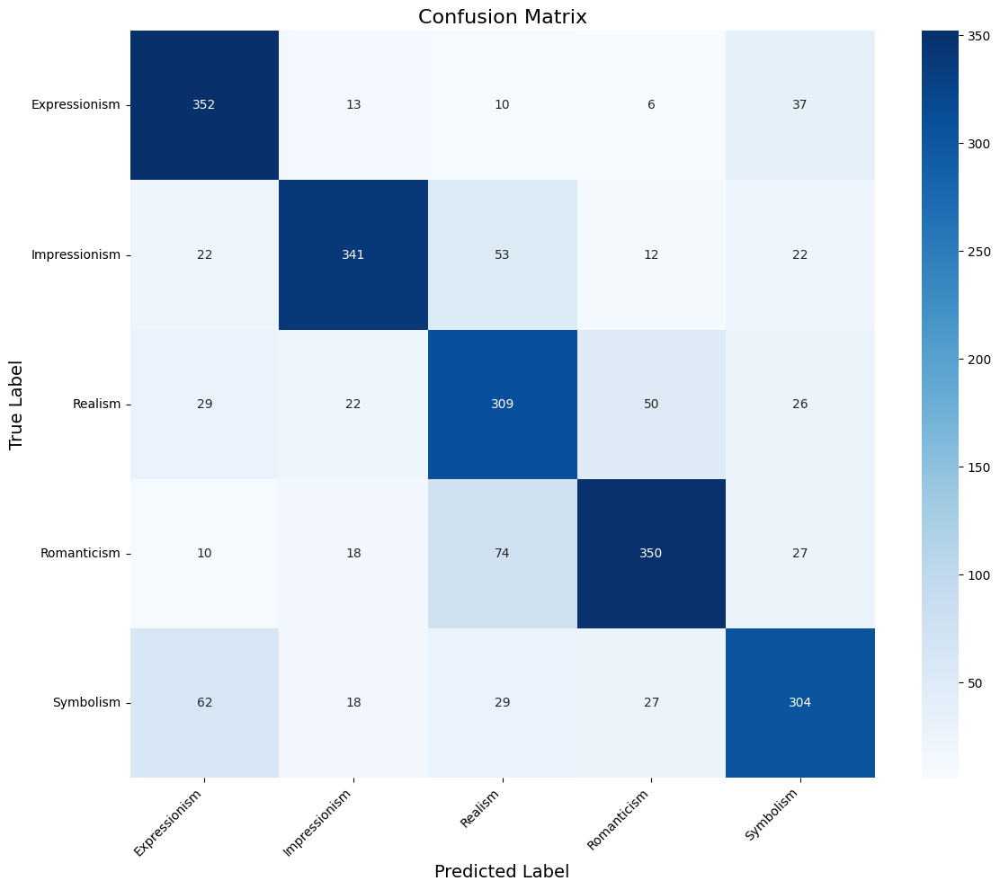

In [2]:
# Test accuracy + Confusion Matrix
import torch
from torch.utils.data import DataLoader, Dataset
from torchvision.datasets import ImageFolder
from torchvision import transforms
from PIL import Image
import shutil
from transformers import AutoModelForImageClassification, AutoImageProcessor
import os
from tqdm import tqdm
import numpy as np
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

#  CONFIG
MODEL_CHOICE = 'resnet50'
BEST_MODEL_PATH = f'./{MODEL_CHOICE}_best_model'
DATA_DIR = 'newarchive'
BATCH_SIZE = 32
TEST_SPLIT = 0.1
OUTPUT_DIR = 'sorted_predictions'

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Dataset Class 
class TransformedDataset(Dataset):
    def __init__(self, subset, transform=None):
        self.subset = subset
        self.transform = transform

    def __getitem__(self, index):
        x, y = self.subset[index]
        original_idx_in_full_dataset = self.subset.indices[index]
        path = self.subset.dataset.samples[original_idx_in_full_dataset][0]
        if self.transform:
            x = self.transform(x)
        return x, y, path

    def __len__(self):
        return len(self.subset)

# --- DATA LOADING AND TRANSFORMS (No changes here) ---
print(f"Loading Image Processor from '{BEST_MODEL_PATH}'")
image_processor = AutoImageProcessor.from_pretrained(BEST_MODEL_PATH)

size = image_processor.size.get('shortest_edge', 224)
mean = image_processor.image_mean
std = image_processor.image_std

test_transforms = transforms.Compose([
    transforms.Resize(size),
    transforms.CenterCrop(size),
    transforms.ToTensor(),
    transforms.Normalize(mean=mean, std=std),
])

print("\nLoading and dividing the dataset...")
full_dataset = ImageFolder(root=DATA_DIR)
test_size = int(len(full_dataset) * TEST_SPLIT)
train_val_size = len(full_dataset) - test_size
generator = torch.Generator().manual_seed(42)
_, test_subset = torch.utils.data.random_split(
    full_dataset, [train_val_size, test_size], generator=generator
)
test_dataset = TransformedDataset(test_subset, transform=test_transforms)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=4, pin_memory=True)
print(f"Dataset Size for prediction: {len(test_dataset)}")

# Model Loading
print(f"\nLoading the best model from '{BEST_MODEL_PATH}'")
model = AutoModelForImageClassification.from_pretrained(BEST_MODEL_PATH)
model.to(device)
model.eval()

# Get class names from the model's configuration
class_names = [model.config.id2label[i] for i in range(len(model.config.id2label))]
print(f"\nFound {len(class_names)} classes: {class_names}")

if os.path.exists(OUTPUT_DIR):
    print(f"Directory '{OUTPUT_DIR}' already exists. Removing it to start fresh.")
    shutil.rmtree(OUTPUT_DIR)
os.makedirs(OUTPUT_DIR)

print(f"Creating {len(class_names)**2} subdirectories for sorting...")

# Create a nested folder structure
for true_style in class_names:
    for pred_style in class_names:
        os.makedirs(os.path.join(OUTPUT_DIR, f'actual_{true_style}', f'predicted_{pred_style}'), exist_ok=True)
print("Directories created successfully.")

# Prediction and sorting loop
all_preds = []
all_labels = []

print("\n--- Starting Prediction and Sorting ---")
with torch.no_grad():
    pbar_test = tqdm(test_loader, desc="Predicting & Sorting")
    for inputs, labels, paths in pbar_test:
        inputs = inputs.to(device)

        outputs = model(pixel_values=inputs).logits
        _, preds = torch.max(outputs, 1)
        
        labels_cpu = labels.cpu().numpy()
        preds_cpu = preds.cpu().numpy()
        
        for i in range(len(paths)):
            original_path = paths[i]
            true_label_idx = labels_cpu[i]
            pred_label_idx = preds_cpu[i]

            true_style_name = class_names[true_label_idx]
            pred_style_name = class_names[pred_label_idx]
            
            dest_folder = os.path.join(OUTPUT_DIR, f'actual_{true_style_name}', f'predicted_{pred_style_name}')

            shutil.copy(original_path, dest_folder)
            
        all_preds.extend(preds_cpu)
        all_labels.extend(labels_cpu)

# Create confusion matrix
accuracy = np.mean(np.array(all_preds) == np.array(all_labels))
print("\n--- Prediction & Sorting Finished ---")
print(f"Test Accuracy: {accuracy * 100:.2f}%")
print(f"Sorted images can be found in the '{OUTPUT_DIR}' directory.")

print("\n--- Creating confusion matrix ---")
cm = confusion_matrix(all_labels, all_preds, labels=range(len(class_names)))
plt.figure(figsize=(12, 10))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
            xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted Label', fontsize=14)
plt.ylabel('True Label', fontsize=14)
plt.title('Confusion Matrix', fontsize=16)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
confusion_matrix_path = 'confusion_matrix.png'
plt.savefig(confusion_matrix_path)
print(f"Confusion matrix has been saved to: {confusion_matrix_path}")
plt.show()

Using device: cuda
Final classification layer (fc layer) removed for T-SNE.

 Found misclassified sample (No. 1): sorted_predictions/actual_Romanticism/predicted_Realism/fyodor-bronnikov_a-fisherman-hunging-fishing-nets-1875.jpg
 - Visualization result has been saved to: gradcam_visualizations_actual_Romanticism_pred_Realism/TRUE_Romanticism_PRED_Realism_fyodorbronnikov_afishermanhungingfishingnets1875.jpg

 Found misclassified sample (No. 2): sorted_predictions/actual_Romanticism/predicted_Realism/thomas-moran_cresheim-glen-wissahickon-autumn-1864-1.jpg
 - Visualization result has been saved to: gradcam_visualizations_actual_Romanticism_pred_Realism/TRUE_Romanticism_PRED_Realism_thomasmoran_cresheimglenwissahickonautumn18641.jpg

 Found misclassified sample (No. 3): sorted_predictions/actual_Romanticism/predicted_Realism/richard-parkes-bonington_henri-iii-and-don-juan-of-austria.jpg
 - Visualization result has been saved to: gradcam_visualizations_actual_Romanticism_pred_Realism/TRUE_

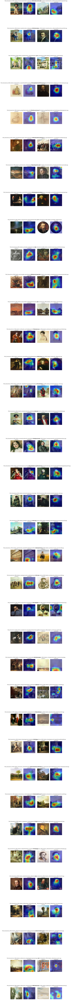


Saved all the original pictures to `original_images_actual_Romanticism_pred_Realism`


In [3]:
# Gradcam
import torch
from torchvision import transforms
from transformers import AutoModelForImageClassification, AutoImageProcessor
import os
from PIL import Image
import numpy as np
from tqdm import tqdm
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler
from scipy.spatial.distance import euclidean
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import random
import shutil

# Gradcam tool
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget

# Config
MODEL_CHOICE = 'resnet50'
BEST_MODEL_PATH = f'./{MODEL_CHOICE}_best_model'
SORTED_DATA_DIR = 'sorted_predictions'
ROMANTICISM_STYLE = "Romanticism"
REALISM_STYLE = "Realism"
RANDOM_STATE = 42
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Loading model and preparing for feature extraction
full_model = AutoModelForImageClassification.from_pretrained(BEST_MODEL_PATH)
full_model.to(device)
full_model.eval()

tsne_model = AutoModelForImageClassification.from_pretrained(BEST_MODEL_PATH)
tsne_model.classifier = torch.nn.Identity()
print("Final classification layer (fc layer) removed for T-SNE.")
tsne_model.to(device)
tsne_model.eval()

image_processor = AutoImageProcessor.from_pretrained(BEST_MODEL_PATH)

# Grad-CAM tool
def get_target_layer(model, model_choice):
    if model_choice == 'resnet50':
        return [model.resnet.encoder.stages[-1]]
    raise NotImplementedError(f"Warning! Received: {model_choice}")

class HFModelWrapper(torch.nn.Module):
    def __init__(self, model):
        super(HFModelWrapper, self).__init__()
        self.model = model

    def forward(self, x):
        return self.model(pixel_values=x).logits

def generate_gradcam_visualization(model, image_processor, model_choice, image_path, true_label, pred_label, output_dir):
    device = next(model.parameters()).device
    os.makedirs(output_dir, exist_ok=True)

    target_layers = get_target_layer(model, model_choice)
    wrapped_model = HFModelWrapper(model)
    cam = GradCAM(model=wrapped_model, target_layers=target_layers)

    size = image_processor.size.get('shortest_edge', 224)

    original_image = Image.open(image_path).convert('RGB')
    rgb_img = np.array(original_image.resize((size, size))) / 255.0
    input_tensor = image_processor(original_image, return_tensors="pt").pixel_values.to(device)

    pred_idx = full_model.config.label2id[pred_label]
    targets = [ClassifierOutputTarget(pred_idx)]

    grayscale_cam = cam(input_tensor=input_tensor, targets=targets)
    grayscale_cam = grayscale_cam[0, :]

    visualization = show_cam_on_image(rgb_img, grayscale_cam, use_rgb=True)

    fig, axes = plt.subplots(1, 2, figsize=(12, 6))
    axes[0].imshow(original_image.resize((size, size)))
    axes[0].set_title(f"Original Image\nTrue Style: {true_label}")
    axes[0].axis("off")

    axes[1].imshow(visualization)
    axes[1].set_title(f"Grad-CAM Heatmap\nModel Predicted: {pred_label}")
    axes[1].axis("off")

    plt.tight_layout()

    base_filename = os.path.basename(image_path)
    safe_filename = "".join([c for c in base_filename if c.isalpha() or c.isdigit() or c in ('.', '_')]).rstrip()
    save_path = os.path.join(output_dir, f"TRUE_{true_label}_PRED_{pred_label}_{safe_filename}")

    plt.savefig(save_path, dpi=150, bbox_inches="tight")
    plt.close(fig)

    print(f" - Visualization result has been saved to: {save_path}")


# Applying Grad-Cam to misclassified pictures
MISCLASSIFIED_STYLE = 'Romanticism'
PREDICTED_STYLE = 'Realism'
MISCLASSIFIED_IMAGE_DIR = f'sorted_predictions/actual_{MISCLASSIFIED_STYLE}/predicted_{PREDICTED_STYLE}'
MAX_VISUALIZATIONS = 90

OUTPUT_VISUALS_DIR = f'gradcam_visualizations_actual_{MISCLASSIFIED_STYLE}_pred_{PREDICTED_STYLE}'
OUTPUT_ORIGINALS_DIR = f'original_images_actual_{MISCLASSIFIED_STYLE}_pred_{PREDICTED_STYLE}'

for d in [OUTPUT_VISUALS_DIR, OUTPUT_ORIGINALS_DIR]:
    if os.path.exists(d):
        shutil.rmtree(d)
    os.makedirs(d, exist_ok=True)

if not os.path.isdir(MISCLASSIFIED_IMAGE_DIR):
    print(f"Error: The directory '{MISCLASSIFIED_IMAGE_DIR}' does not exist.")
    exit()

all_misclassified_paths = [os.path.join(MISCLASSIFIED_IMAGE_DIR, f) for f in os.listdir(MISCLASSIFIED_IMAGE_DIR) if f.endswith(('.png', '.jpg', '.jpeg'))]

count = 0
for img_path in all_misclassified_paths:
    if count >= MAX_VISUALIZATIONS:
        break

    print(f"\n Found misclassified sample (No. {count + 1}): {img_path}")

    generate_gradcam_visualization(
        model=full_model,
        image_processor=image_processor,
        model_choice=MODEL_CHOICE,
        image_path=img_path,
        true_label=MISCLASSIFIED_STYLE,
        pred_label=PREDICTED_STYLE,
        output_dir=OUTPUT_VISUALS_DIR
    )

    orig_fname = os.path.basename(img_path)
    dest_orig = os.path.join(OUTPUT_ORIGINALS_DIR, orig_fname)
    with Image.open(img_path) as im:
        im = im.convert('RGB')
        im_resized = im.resize((224, 224), Image.BILINEAR)
        im_resized.save(dest_orig)

    count += 1

    
# Visualization
if count == 0:
    print(f"Haven't found any pictures in '{MISCLASSIFIED_IMAGE_DIR}'")
else:
    print(f"\nCreated {count} original+heatmap pairs.")
    print(f"--- Presenting visualizations from '{OUTPUT_VISUALS_DIR}' ---")

    composite_files = sorted([
        os.path.join(OUTPUT_VISUALS_DIR, f)
        for f in os.listdir(OUTPUT_VISUALS_DIR)
        if f.endswith(('.png', '.jpg', '.jpeg'))
    ])

    num = len(composite_files)
    if num > 0:
        cols = 2
        rows = int(np.ceil(num / cols))
        fig, axes = plt.subplots(rows, cols, figsize=(10, 5 * rows))
        axes = axes.flatten() if rows * cols > 1 else [axes]

        for idx, comp_path in enumerate(composite_files):
            img = Image.open(comp_path)
            axes[idx].imshow(img)
            axes[idx].set_title(os.path.basename(comp_path), fontsize=10, wrap=True)
            axes[idx].axis('off')

        for j in range(idx + 1, len(axes)):
            axes[j].axis('off')

        plt.tight_layout(pad=2.0)
        plt.show()
    else:
        print("No visualizations were generated.")

print(f"\nSaved all the original pictures to `{OUTPUT_ORIGINALS_DIR}`")

Using device: cuda
Final classification layer (fc layer) removed.
Found 350 images for CC_Romanticism group.
Found 74 images for M_Romanticism_as_Realism group.
Found 309 images for CC_Realism group.
Processing group: CC_Romanticism


Extracting CC_Romanticism: 100%|██████████| 350/350 [00:22<00:00, 15.63it/s]


Processing group: M_Romanticism_as_Realism


Extracting M_Romanticism_as_Realism: 100%|██████████| 74/74 [00:02<00:00, 29.91it/s]


Processing group: CC_Realism


Extracting CC_Realism: 100%|██████████| 309/309 [00:19<00:00, 16.25it/s]


Successfully extracted 733 embeddings with dimension 2048.
t-SNE transformation complete.
Visualization saved to 'tsne_visualization_corrected.png'


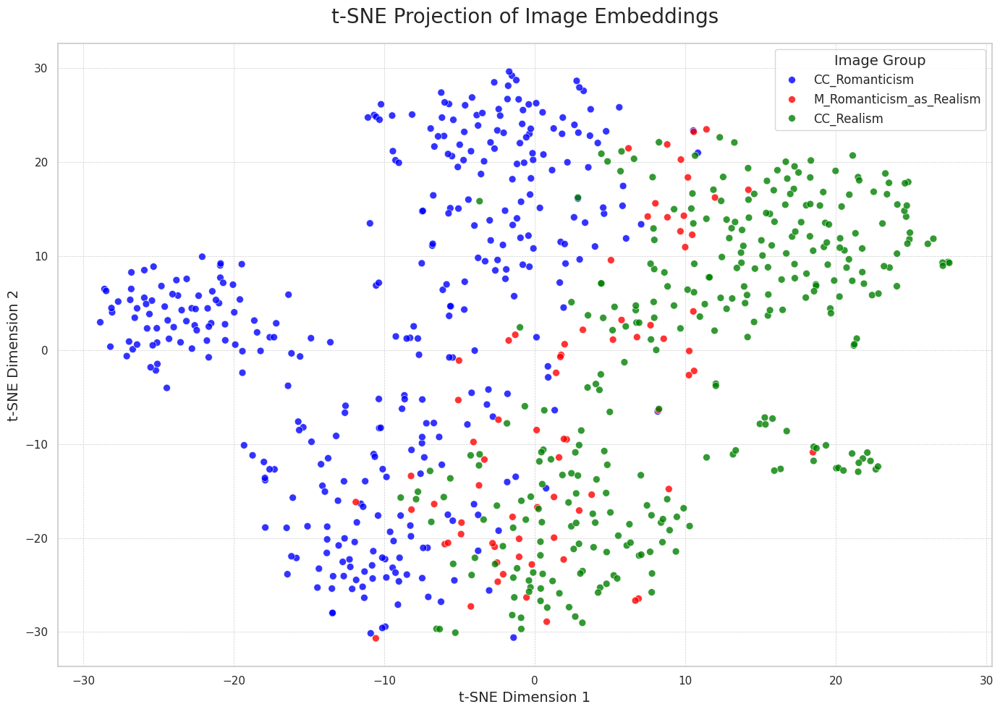

High-dimensional embeddings have been standardized for fair distance calculation.
Centroids for each group calculated.

--- Quantitative Distance Results ---
Distance from M_Romanticism_as_Realism prototype to CC_Romanticism prototype: 16.3553
Distance from M_Romanticism_as_Realism prototype to CC_Realism prototype: 11.3162

--- Conclusion ---
 The misclassified group's prototype is quantitatively CLOSER to the Realism prototype.
This provides strong evidence that the model misclassified these images because their features are, on average, more similar to Realism.


In [4]:
# T-SNE 
import torch
from torchvision import transforms
from transformers import AutoModelForImageClassification, AutoImageProcessor
import os
from PIL import Image
import numpy as np
from tqdm import tqdm
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler
from scipy.spatial.distance import euclidean
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import random


# Config
MODEL_CHOICE = 'resnet50'
BEST_MODEL_PATH = f'./{MODEL_CHOICE}_best_model'
SORTED_DATA_DIR = 'sorted_predictions' 
ROMANTICISM_STYLE = "Romanticism"
REALISM_STYLE = "Realism"
RANDOM_STATE = 42 
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")


# Model loading and modification
model = AutoModelForImageClassification.from_pretrained(BEST_MODEL_PATH)
model.classifier = torch.nn.Identity()
print("Final classification layer (fc layer) removed.")
model.to(device)
model.eval()

image_processor = AutoImageProcessor.from_pretrained(BEST_MODEL_PATH)
val_transforms = transforms.Compose([
    transforms.Resize(image_processor.size["shortest_edge"]),
    transforms.CenterCrop(image_processor.size["shortest_edge"]),
    transforms.ToTensor(),
    transforms.Normalize(mean=image_processor.image_mean, std=image_processor.image_std),
])


# Get embedding function
def get_embedding(image_path, model, transforms, device):
    """Processes a single image and returns its high-dimensional embedding."""
    try:
        image = Image.open(image_path).convert("RGB")
        transformed_image = transforms(image).unsqueeze(0).to(device)
        with torch.no_grad():
            embedding = model(pixel_values=transformed_image).logits
        return embedding.squeeze().cpu().numpy()
    except Exception as e:
        print(f"Warning: Could not process image {image_path}. Error: {e}")
        return None

    
# Gathering image paths for each group
image_paths = {
    "CC_Romanticism": [],
    "M_Romanticism_as_Realism": [],
    "CC_Realism": []
}
cc_romanticism_path = os.path.join(SORTED_DATA_DIR, f'actual_{ROMANTICISM_STYLE}', f'predicted_{ROMANTICISM_STYLE}')
if os.path.isdir(cc_romanticism_path):
    image_paths["CC_Romanticism"] = [os.path.join(cc_romanticism_path, f) for f in os.listdir(cc_romanticism_path)]
print(f"Found {len(image_paths['CC_Romanticism'])} images for CC_Romanticism group.")
mr_as_realism_path = os.path.join(SORTED_DATA_DIR, f'actual_{ROMANTICISM_STYLE}', f'predicted_{REALISM_STYLE}')
if os.path.isdir(mr_as_realism_path):
    image_paths["M_Romanticism_as_Realism"] = [os.path.join(mr_as_realism_path, f) for f in os.listdir(mr_as_realism_path)]
print(f"Found {len(image_paths['M_Romanticism_as_Realism'])} images for M_Romanticism_as_Realism group.")
cc_realism_path = os.path.join(SORTED_DATA_DIR, f'actual_{REALISM_STYLE}', f'predicted_{REALISM_STYLE}')
if os.path.isdir(cc_realism_path):
    image_paths["CC_Realism"] = [os.path.join(cc_realism_path, f) for f in os.listdir(cc_realism_path)]
print(f"Found {len(image_paths['CC_Realism'])} images for CC_Realism group.")


# Extract embeddings
all_embeddings = []
all_labels = []
for group_name, paths in image_paths.items():
    if not paths: continue
    print(f"Processing group: {group_name}")
    for path in tqdm(paths, desc=f"Extracting {group_name}"):
        embedding = get_embedding(path, model, val_transforms, device)
        if embedding is not None:
            all_embeddings.append(embedding)
            all_labels.append(group_name)
embeddings_array = np.array(all_embeddings)
all_labels = np.array(all_labels)
print(f"Successfully extracted {embeddings_array.shape[0]} embeddings with dimension {embeddings_array.shape[1]}.")


# t-SNE dimensionality reduction and visualization
tsne = TSNE(
    n_components=2, perplexity=30, learning_rate='auto',
    init='pca', max_iter=1000, random_state=RANDOM_STATE
)
embedding_2d = tsne.fit_transform(embeddings_array)
print("t-SNE transformation complete.")

df = pd.DataFrame({'x': embedding_2d[:, 0], 'y': embedding_2d[:, 1], 'group': all_labels})
palette = {"CC_Romanticism": "blue", "M_Romanticism_as_Realism": "red", "CC_Realism": "green"}
plt.figure(figsize=(14, 10))
sns.set(style="whitegrid")
ax = sns.scatterplot(data=df, x='x', y='y', hue='group', palette=palette, s=50, alpha=0.8, edgecolor='w', linewidth=0.5)
plt.title('t-SNE Projection of Image Embeddings', fontsize=20, pad=20)
plt.xlabel('t-SNE Dimension 1', fontsize=14)
plt.ylabel('t-SNE Dimension 2', fontsize=14)
plt.legend(title='Image Group', fontsize=12, title_fontsize=14)
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()
output_filename = 'tsne_visualization_corrected.png'
plt.savefig(output_filename, dpi=300)
print(f"Visualization saved to '{output_filename}'")
plt.show()


# Calculate the distance from centroid
scaler = StandardScaler()
scaled_embeddings = scaler.fit_transform(embeddings_array)
print("High-dimensional embeddings have been standardized for fair distance calculation.")

embeddings_ccr = scaled_embeddings[all_labels == 'CC_Romanticism']
embeddings_mr = scaled_embeddings[all_labels == 'M_Romanticism_as_Realism']
embeddings_realism = scaled_embeddings[all_labels == 'CC_Realism']

centroid_ccr = embeddings_ccr.mean(axis=0)
centroid_mr = embeddings_mr.mean(axis=0)
centroid_realism = embeddings_realism.mean(axis=0)
print("Centroids for each group calculated.")

dist_to_ccr = euclidean(centroid_mr, centroid_ccr)
dist_to_realism = euclidean(centroid_mr, centroid_realism)

print("\n--- Quantitative Distance Results ---")
print(f"Distance from M_Romanticism_as_Realism prototype to CC_Romanticism prototype: {dist_to_ccr:.4f}")
print(f"Distance from M_Romanticism_as_Realism prototype to CC_Realism prototype: {dist_to_realism:.4f}")

print("\n--- Conclusion ---")
if dist_to_realism < dist_to_ccr:
    print(" The misclassified group's prototype is quantitatively CLOSER to the Realism prototype.")
    print("This provides strong evidence that the model misclassified these images because their features are, on average, more similar to Realism.")
else:
    print(" The misclassified group's prototype is quantitatively CLOSER to the Romanticism prototype.")
    print("This might suggest that while these images were misclassified, their average features still align with their original class.")

Processing group: 'M_Romanticism_as_Realism', folder: 'sorted_predictions/actual_Romanticism/predicted_Realism'


Analyzing M_Romanticism_as_Realism: 100%|██████████| 74/74 [00:01<00:00, 42.59it/s]


Processing group: 'CC_Romanticism', folder: 'sorted_predictions/actual_Romanticism/predicted_Romanticism'


Analyzing CC_Romanticism: 100%|██████████| 350/350 [00:08<00:00, 42.50it/s]


Processing group: 'CC_Realism', folder: 'sorted_predictions/actual_Realism/predicted_Realism'


Analyzing CC_Realism: 100%|██████████| 309/309 [00:07<00:00, 42.34it/s]



--- Color feature extraction complete ---
Total samples: 733, Total features: 694

--- Calculating distances to color prototypes (centroids) ---

--- Analysis Results for Misclassified Samples' Color Features ---
Based on color, the misclassified samples are closer to:
closer_to
realism        52
romanticism    22
Name: count, dtype: int64

→ 29.7% of samples are closer to Romanticism in color
→ 70.3% of samples are closer to Realism in color


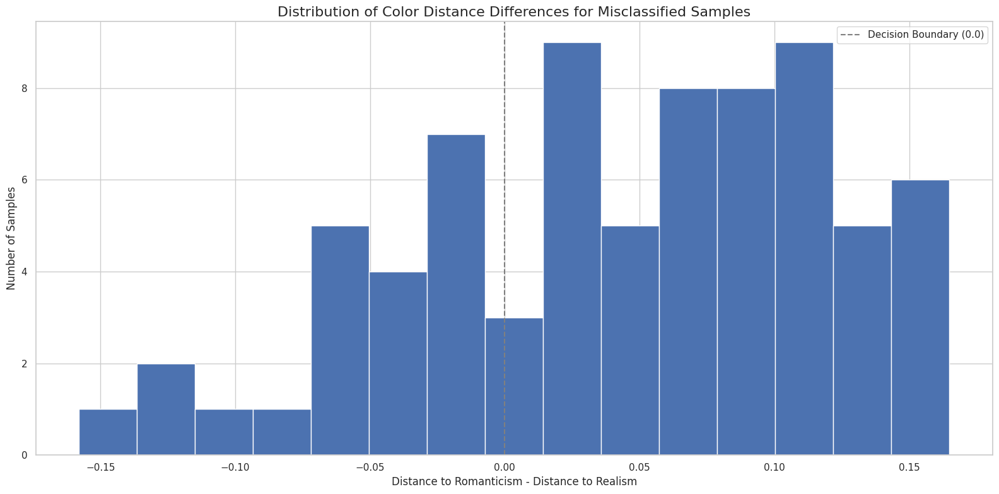

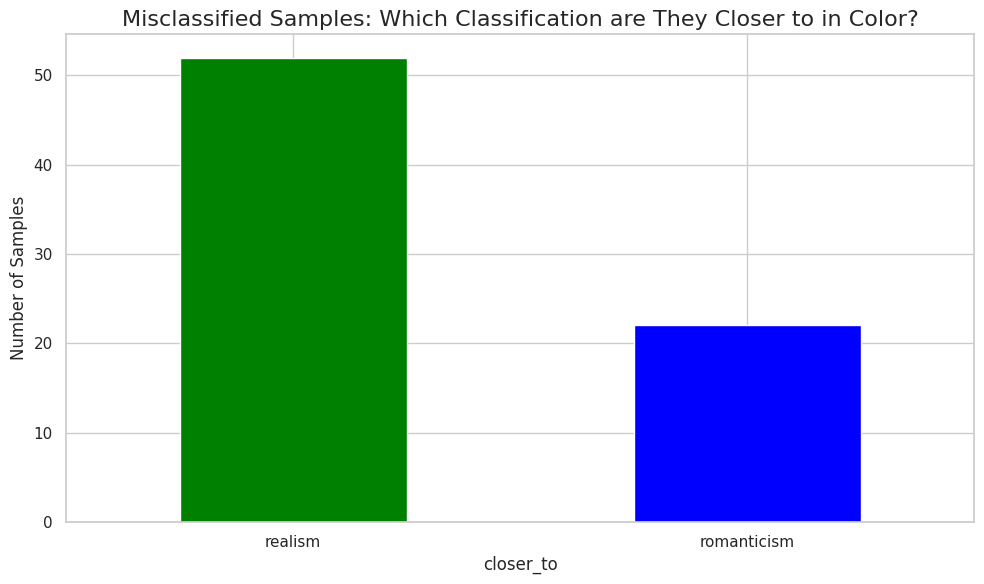

In [10]:
# HSV
import os
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm

# Config
SORTED_DATA_DIR = 'sorted_predictions'
ROMANTICISM_STYLE = "Romanticism"
REALISM_STYLE = "Realism"

IMAGE_DIRS = {
    'M_Romanticism_as_Realism': os.path.join(SORTED_DATA_DIR, f'actual_{ROMANTICISM_STYLE}', f'predicted_{REALISM_STYLE}'),
    'CC_Romanticism': os.path.join(SORTED_DATA_DIR, f'actual_{ROMANTICISM_STYLE}', f'predicted_{ROMANTICISM_STYLE}'),
    'CC_Realism': os.path.join(SORTED_DATA_DIR, f'actual_{REALISM_STYLE}', f'predicted_{REALISM_STYLE}')
}

# Feature extraction
def calculate_normalized_histogram(image_path):
    """Calculates a flattened, normalized HSV color histogram for a single image."""
    image = cv2.imread(image_path)
    if image is None:
        print(f"Warning: Could not read image {image_path}. Skipping.")
        return None

    hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    channels = [0, 1, 2]
    hist_sizes = [180, 256, 256] 
    ranges = [[0, 180], [0, 256], [0, 256]] 

    histograms = []

    for i in channels:
        hist = cv2.calcHist(images=[hsv_image], channels=[i], mask=None,
                              histSize=[hist_sizes[i]], ranges=ranges[i])
        cv2.normalize(hist, hist) 
        histograms.append(hist)

    return np.concatenate(histograms).flatten()


# Extracting color features from images
records = []

for group, folder in IMAGE_DIRS.items():
    print(f"Processing group: '{group}', folder: '{folder}'")
    if not os.path.isdir(folder):
        print(f"Warning: Folder not found, skipping: {folder}")
        continue

    image_files = [os.path.join(folder, f) for f in os.listdir(folder)
                   if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

    if len(image_files) == 0:
        print(f"Info: No images with matching extensions found in {folder}. Skipping.")
        continue

    for path in tqdm(image_files, desc=f"Analyzing {group}"):
        feats = calculate_normalized_histogram(path)
        if feats is None:
            continue

        record = {f'color_bin_{i}': float(val) for i, val in enumerate(feats)}
        record['group'] = group
        record['image'] = os.path.basename(path)
        records.append(record)

if len(records) == 0:
    print("\nFailed to extract color features from any image.")
    raise SystemExit(0)

df = pd.DataFrame(records)
print("\n--- Color feature extraction complete ---")
print(f"Total samples: {len(df)}, Total features: {df.shape[1]}")


# Calculate Centroids and Analyze Distances for Each Misclassified Sample
if 'M_Romanticism_as_Realism' in df['group'].unique():
    print("\n--- Calculating distances to color prototypes (centroids) ---")
    feature_cols = [c for c in df.columns if c.startswith('color_bin_')]

    if not (('CC_Romanticism' in df['group'].unique()) and ('CC_Realism' in df['group'].unique())):
        print("Warning: 'Pure' groups are incomplete.")
        raise SystemExit(0)

    centroid_rom = df[df['group'] == 'CC_Romanticism'][feature_cols].mean().values
    centroid_real = df[df['group'] == 'CC_Realism'][feature_cols].mean().values

    mis_df = df[df['group'] == 'M_Romanticism_as_Realism'].copy()
    if len(mis_df) == 0:
        print("Info: No misclassified samples to analyze.")
        raise SystemExit(0)

    X_mis = mis_df[feature_cols].values
    dist_to_rom = np.linalg.norm(X_mis - centroid_rom[np.newaxis, :], axis=1)
    dist_to_real = np.linalg.norm(X_mis - centroid_real[np.newaxis, :], axis=1)

    mis_df['dist_to_rom'] = dist_to_rom
    mis_df['dist_to_real'] = dist_to_real
    mis_df['closer_to'] = np.where(dist_to_rom < dist_to_real, 'romanticism', 'realism')

    counts = mis_df['closer_to'].value_counts()
    total = len(mis_df)

    print("\n--- Analysis Results for Misclassified Samples' Color Features ---")
    print("Based on color, the misclassified samples are closer to:")
    print(counts)
    if total > 0:
        print(f"\n→ {counts.get('romanticism', 0) / total * 100:.1f}% of samples are closer to Romanticism in color")
        print(f"→ {counts.get('realism', 0) / total * 100:.1f}% of samples are closer to Realism in color")

    # Visualization
    sns.set(style="whitegrid")

    diff = mis_df['dist_to_rom'] - mis_df['dist_to_real']
    plt.figure(figsize=(16, 8))
    plt.hist(diff, bins=15)
    plt.axvline(0, linestyle='--', color='gray', label='Decision Boundary (0.0)')
    plt.xlabel('Distance to Romanticism - Distance to Realism', fontsize=12)
    plt.ylabel('Number of Samples', fontsize=12)
    plt.title('Distribution of Color Distance Differences for Misclassified Samples', fontsize=16)
    plt.legend()
    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(10, 6))
    counts_sorted = counts.sort_index()
    color_map = {'realism': 'green', 'romanticism': 'blue'}
    bar_colors = [color_map.get(k, 'gray') for k in counts_sorted.index]
    counts_sorted.plot(kind='bar', color=bar_colors)
    plt.ylabel('Number of Samples', fontsize=12)
    plt.title('Misclassified Samples: Which Classification are They Closer to in Color?', fontsize=16)
    plt.xticks(rotation=0)
    plt.tight_layout()
    plt.show()
else:
    print("\n'misclassified' group not found in DataFrame.")

--- Extracting features from images ---
Processing group: 'M_Romanticism_as_Realism' in folder: 'sorted_predictions/actual_Romanticism/predicted_Realism'
Processing group: 'CC_Romanticism' in folder: 'sorted_predictions/actual_Romanticism/predicted_Romanticism'
Processing group: 'CC_Realism' in folder: 'sorted_predictions/actual_Realism/predicted_Realism'

--- Calculating distances to centroids ---
Misclassified samples closer to each style:
closer_to
realism        68
romanticism     6
Name: count, dtype: int64

→ 8.1% closer to Romanticism
→ 91.9% closer to Realism

--- Generating plots ---


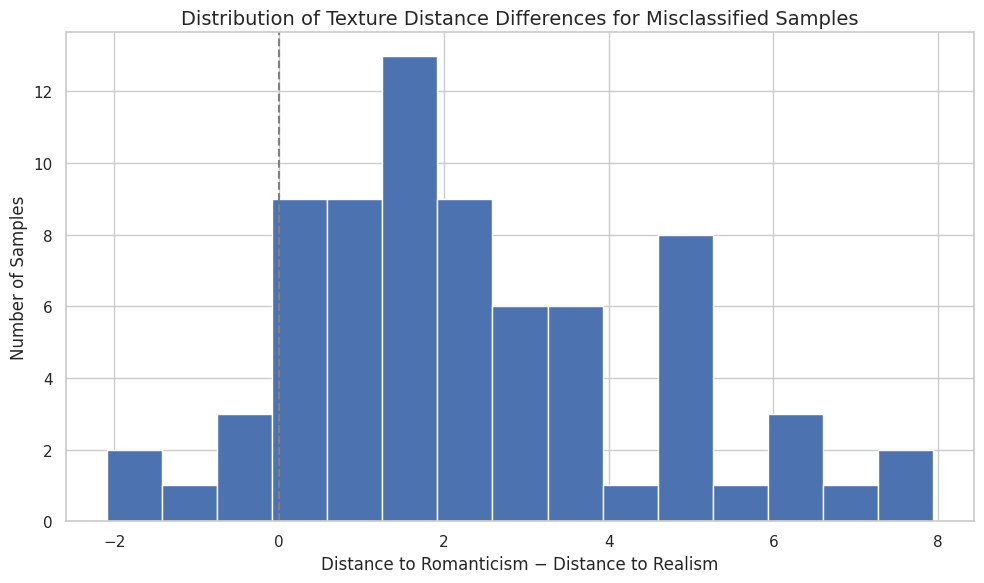

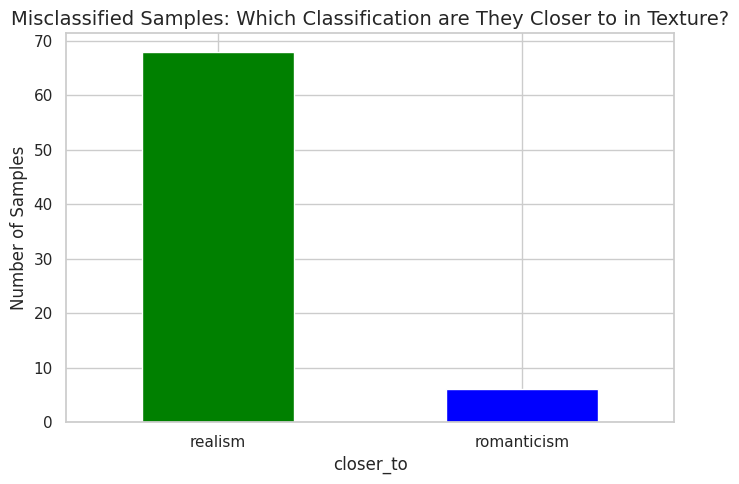

In [11]:
# LBP+Gabor
import os
import cv2
import numpy as np
import pandas as pd
from skimage.feature import local_binary_pattern
from skimage.filters import gabor
import matplotlib.pyplot as plt

# Config
SORTED_DATA_DIR = 'sorted_predictions' 
ROMANTICISM_STYLE = "Romanticism"
REALISM_STYLE = "Realism"

IMAGE_DIRS = {
    'M_Romanticism_as_Realism': os.path.join(SORTED_DATA_DIR, f'actual_{ROMANTICISM_STYLE}', f'predicted_{REALISM_STYLE}'),
    'CC_Romanticism': os.path.join(SORTED_DATA_DIR, f'actual_{ROMANTICISM_STYLE}', f'predicted_{ROMANTICISM_STYLE}'),
    'CC_Realism': os.path.join(SORTED_DATA_DIR, f'actual_{REALISM_STYLE}', f'predicted_{REALISM_STYLE}')
}


# Extract texture features：LBP + Gabor
def extract_texture_features(img_path):
    img = cv2.imread(img_path)
    if img is None:
        print(f"Warning: Could not read image {img_path}")
        return None
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    feats = {}
    
    # LBP
    lbp = local_binary_pattern(gray, P=8, R=1, method='uniform')
    max_bin = int(lbp.max()) + 1
    hist, _ = np.histogram(lbp.ravel(),
                           bins=np.arange(0, max_bin+1),
                           density=True)
    for i in range(max_bin):
        feats[f'lbp_{i}'] = hist[i]
    
    # Gabor
    for theta in [0, np.pi/4, np.pi/2, 3*np.pi/4]:
        real, _ = gabor(gray, frequency=0.6, theta=theta)
        deg = int(theta * 180 / np.pi)
        feats[f'gabor_mean_{deg}'] = real.mean()
        feats[f'gabor_std_{deg}']  = real.std()
    
    return feats


# Extract
print("--- Extracting features from images ---")
records = []
for group, folder in IMAGE_DIRS.items():
    print(f"Processing group: '{group}' in folder: '{folder}'")
    if not os.path.isdir(folder):
        print(f"Warning: Directory not found, skipping: {folder}")
        continue
    for fname in os.listdir(folder):
        if not fname.lower().endswith(('.png','.jpg','.jpeg')):
            continue
        path = os.path.join(folder, fname)
        feats = extract_texture_features(path)
        if feats is None:
            continue
        feats['group'] = group
        feats['image'] = fname
        records.append(feats)

df = pd.DataFrame(records)


# Calculate distance
print("\n--- Calculating distances to centroids ---")
feature_cols = [c for c in df.columns if c not in ('group','image')]

centroid_rom  = df[df.group=='CC_Romanticism'][feature_cols].mean().values
centroid_real = df[df.group=='CC_Realism'][feature_cols].mean().values

mis = df[df.group=='M_Romanticism_as_Realism'].copy()
X_mis = mis[feature_cols].values
dist_to_rom  = np.linalg.norm(X_mis - centroid_rom[np.newaxis,:],  axis=1)
dist_to_real = np.linalg.norm(X_mis - centroid_real[np.newaxis,:], axis=1)
mis['closer_to'] = np.where(dist_to_rom < dist_to_real, 'romanticism', 'realism')

counts = mis['closer_to'].value_counts()
total = len(mis)
print("Misclassified samples closer to each style:")
print(counts)
if total > 0:
    print(f"\n→ {counts.get('romanticism',0)/total*100:.1f}% closer to Romanticism")
    print(f"→ {counts.get('realism',0)/total*100:.1f}% closer to Realism")

# PLT
print("\n--- Generating plots ---")
diff = dist_to_rom - dist_to_real
plt.figure(figsize=(10,6))
plt.hist(diff, bins=15)
plt.axvline(0, linestyle='--', color='gray')
plt.xlabel('Distance to Romanticism − Distance to Realism', fontsize=12)
plt.ylabel('Number of Samples', fontsize=12)
plt.title('Distribution of Texture Distance Differences for Misclassified Samples', fontsize=14)
plt.tight_layout()
plt.show()


plt.figure(figsize=(7,5))
counts.sort_index().plot(kind='bar', color=['green', 'blue'])
plt.ylabel('Number of Samples', fontsize=12)
plt.title('Misclassified Samples: Which Classification are They Closer to in Texture?', fontsize=14)
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()